In [1]:
import tensorflow as tf
from keras import backend
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
import time
from PIL import Image
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
from scipy.misc import imsave
import matplotlib.pylab as plt

Using TensorFlow backend.


In [2]:
def load_image(path, height, width):
    
    img = image.load_img(path, target_size = (height, width))   #load image from the given path and reshape the image into given size
    
    x = image.img_to_array(img)  # turn the image to an np array
    
    x_plus_batch = np.expand_dims(x, axis = 0)  # expand 0th dimension which is the batch size
    
    img_array = preprocess_input(x_plus_batch)
    
    return img, img_array
#img_array#two return values, first one is the original image, second is the preprocessed array

In [3]:
def restore_image(image_array):
    '''
    This function takes an (1,height, width, 3) mean-subtracted BGR channel sequence image array and return a mean-added
    (height, width, 3) RGB channel sequence image array
    '''
    mean = [103.939, 116.779, 123.68] #precalculated BGR mean from Imagenet Database
    mean = backend.cast(mean, dtype='float16')
    img_array = backend.cast(image_array.reshape((height, width, 3)),dtype='float16')
    added_img = backend.bias_add(img_array, mean)
    with tf.Session() as sess:
        array = added_img.eval()
    array = array[:, :, ::-1]
    image_array_restored = np.clip(array, 0, 225).astype('uint8')
    return image_array_restored

In [4]:
def get_average_style_image(style1_array, style2_array):
    '''
    This function returns the style of the two artistic input by averaging the piexel values of each channel input
    '''
    return 0.5 * (style1_array + style2_array)

In [5]:
def content_loss(content, combination):
    channel = int(content.shape[2])
    length = int(content.shape[0])
    size = length ** 2
    loss = backend.sum(backend.square(combination - content)) / 2
    return loss

In [6]:
def gram_matrix(x):
    '''
    calculate the gram matrix from the output of a certain VGG16 layer
    output should be a square matrix with the length being the number of the channels of that particular feature map
    '''
    num_channels = x.shape[len(x.shape)-1]
    reshaped = backend.reshape(x, shape=(-1, num_channels))
    gram = backend.dot(backend.transpose(reshaped), reshaped)
    return gram

In [7]:
def layer_wise_style_loss(averaged_pic, style1, style2, combination, option, w=None):
    gram_combination = gram_matrix(combination)
    channel = int(averaged_pic.shape[2])
    length = int(averaged_pic.shape[0])
    size = length ** 2
    if option == 'averaged_pic':
        gram_averaged_pic = gram_matrix(averaged_pic)
        loss = backend.sum(backend.square(gram_combination - gram_averaged_pic)) / (4 * (size **2) * (channel **2))
    if option == 'averaged_gram':
        gram_style1 = gram_matrix(style1)
        gram_style2 = gram_matrix(style2)
        averaged_gram = 0.5 * (gram_style1 + gram_style2)
        loss = backend.sum(backend.square(gram_combination - averaged_gram)) / (4 * (size **2) * (channel **2))
    if option == 'weighted_gram':
        gram_style1 = gram_matrix(style1)
        gram_style2 = gram_matrix(style2)
        loss1 = backend.sum(backend.square(gram_combination - gram_style1)) / (4 * (size **2) * (channel **2))
        loss2 = backend.sum(backend.square(gram_combination - gram_style2)) / (4 * (size **2) * (channel **2))
        loss = w * (loss1 - loss2) + loss2
    return loss

In [8]:
def total_loss(layers, content_layer, content_weight, style_layer, style_weight, option = None, w = None):
    loss = backend.variable(0.)
    layer_feature_content = layers[content_layer[0]]
    content_image_features = layer_feature_content[0, :, :, :]
    combination_features = layer_feature_content[4, :, :, :]
    loss += content_loss(content_image_features, combination_features) * content_weight
    for layer in style_layer:
        layer_features = layers[layer]
        averaged_pic = layer_features[1, :, :, :]
        style1 = layer_features[2, :, :, :]
        style2= layer_features[3, :, :, :]
        combination= layer_features[4, :, :, :]
        loss += layer_wise_style_loss(averaged_pic, style1, style2, combination, option = option, w=w) * style_weight
    return loss

In [9]:
def eval_loss_and_grads(x):
    x = x.reshape((1, 512, 512, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    grad_values = outs[1].flatten().astype('float64')
    return loss_value, grad_values

In [10]:
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

In [11]:
height = 512
width = 512
    
content_path = r'C:/Users/ligengxia/Desktop/images/content.jpg'
style1_path = r'C:/Users/ligengxia/Desktop/images/style1.jpg'
style2_path = r'C:/Users/ligengxia/Desktop/images/style2.jpg'
    
content_image, content_array= load_image(content_path, height, width)
style1_image, style1_array = load_image(style1_path, height, width)
style2_image, style2_array = load_image(style2_path, height, width)
    
average_style_array = get_average_style_image(style1_array, style2_array)
    
content_image= backend.variable(content_array)
average_style_image = backend.variable(average_style_array)
style1_image = backend.variable(style1_array)
style2_image = backend.variable(style2_array)
combination_image = backend.placeholder((1,height,width,3))
    
input_tensor = backend.concatenate([content_image,average_style_image,style1_image,style2_image, combination_image], axis=0)
    
model = VGG16(input_tensor=input_tensor, weights='imagenet', include_top=False)
    
layers = dict([(layer.name, layer.output) for layer in model.layers])
    
style_layer = ['block1_conv2', 'block2_conv2','block3_conv3', 'block4_conv3','block5_conv3']
    
content_layer = ['block2_conv2']


# Averaged Picture

In [12]:
content_weight = 0.005
style_weight = 300
option = 'averaged_pic'

In [13]:
loss = total_loss(layers, content_layer, content_weight, style_layer, style_weight, option)
grads = backend.gradients(loss, combination_image)
outputs = [loss]
outputs += grads

In [14]:
f_outputs = backend.function([combination_image], outputs)
evaluator = Evaluator()
x = np.random.uniform(0, 255, (1, height, width, 3)) - 128

epochs = 100

loss_value = []
x_list = []


for i in range(epochs):
    s_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun = 20)
    loss_value.append(min_val)
    x_list.append(x)
    f_time = time.time()
    if i % 10 == 0:
        print('Currtent epoch is', i, end = "; ")
        print('Current loss value:', min_val)
        print('epoch %d completed in %ds' % (i, f_time - s_time))
plt.figure()
plt.title('Loss')
plt.plot(range(epochs), loss_value, 'red')
backend.clear_session()

Currtent epoch is 0; Current loss value: 1.76196e+10
epoch 0 completed in 30s
Currtent epoch is 10; Current loss value: 2.83128e+09
epoch 10 completed in 25s
Currtent epoch is 20; Current loss value: 1.95194e+09
epoch 20 completed in 25s
Currtent epoch is 30; Current loss value: 1.58357e+09
epoch 30 completed in 25s
Currtent epoch is 40; Current loss value: 1.40565e+09
epoch 40 completed in 25s
Currtent epoch is 50; Current loss value: 1.30183e+09
epoch 50 completed in 25s
Currtent epoch is 60; Current loss value: 1.23565e+09
epoch 60 completed in 25s
Currtent epoch is 70; Current loss value: 1.19713e+09
epoch 70 completed in 25s
Currtent epoch is 80; Current loss value: 1.17118e+09
epoch 80 completed in 25s
Currtent epoch is 90; Current loss value: 1.15317e+09
epoch 90 completed in 25s


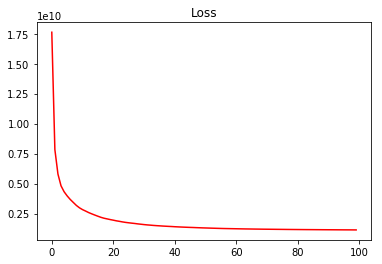

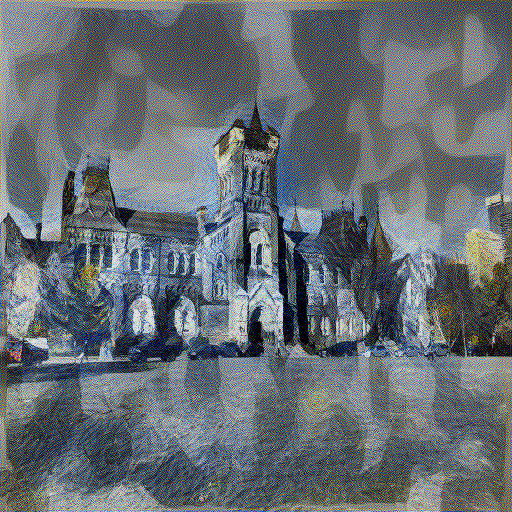

In [15]:
plt.show()
Image.fromarray(restore_image(x))

# Averaged Gram Matrix

In [16]:
height = 512
width = 512
    
content_path = r'C:/Users/ligengxia/Desktop/images/content.jpg'
style1_path = r'C:/Users/ligengxia/Desktop/images/style1.jpg'
style2_path = r'C:/Users/ligengxia/Desktop/images/style2.jpg'
    
content_image, content_array= load_image(content_path, height, width)
style1_image, style1_array = load_image(style1_path, height, width)
style2_image, style2_array = load_image(style2_path, height, width)
    
average_style_array = get_average_style_image(style1_array, style2_array)
    
content_image= backend.variable(content_array)
average_style_image = backend.variable(average_style_array)
style1_image = backend.variable(style1_array)
style2_image = backend.variable(style2_array)
combination_image = backend.placeholder((1,height,width,3))
    
input_tensor = backend.concatenate([content_image,average_style_image,style1_image,style2_image, combination_image], axis=0)
    
model = VGG16(input_tensor=input_tensor, weights='imagenet', include_top=False)
    
layers = dict([(layer.name, layer.output) for layer in model.layers])
    
style_layer = ['block1_conv2', 'block2_conv2','block3_conv3', 'block4_conv3','block5_conv3']
    
content_layer = ['block2_conv2']

In [17]:
content_weight = 0.01
style_weight = 400
option = 'averaged_gram'

In [18]:
loss = total_loss(layers, content_layer, content_weight, style_layer, style_weight, option)
grads = backend.gradients(loss, combination_image)
outputs = [loss]
outputs += grads

In [19]:
f_outputs = backend.function([combination_image], outputs)
evaluator = Evaluator()
x = np.random.uniform(0, 255, (1, height, width, 3)) - 128

epochs = 100

loss_value = []
x_list = []


for i in range(epochs):
    s_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun = 20)
    loss_value.append(min_val)
    x_list.append(x)
    f_time = time.time()
    if i % 10 == 0:
        print('Currtent epoch is', i, end = "; ")
        print('Current loss value:', min_val)
        print('epoch %d completed in %ds' % (i, f_time - s_time))
plt.figure()
plt.title('Loss')
plt.plot(range(epochs), loss_value, 'red')
backend.clear_session()

Currtent epoch is 0; Current loss value: 7.38578e+10
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 1.21575e+10
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 8.72646e+09
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 7.03588e+09
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 6.19331e+09
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 5.66634e+09
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 5.33709e+09
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 5.11735e+09
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 4.97074e+09
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 4.85591e+09
epoch 90 completed in 26s


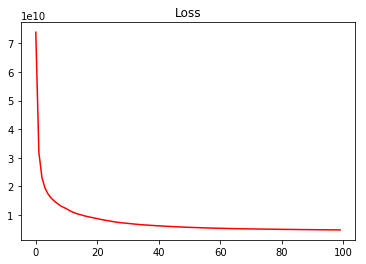

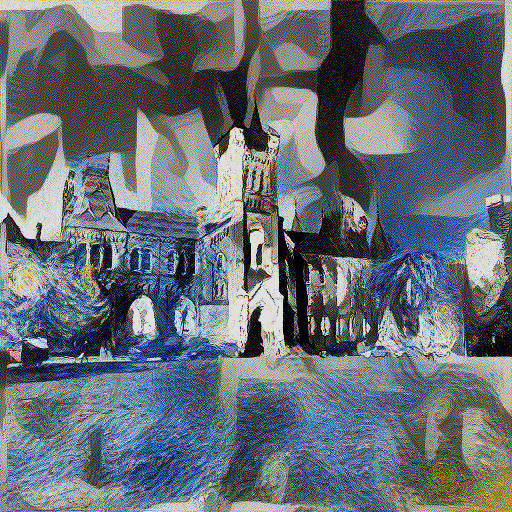

In [20]:
plt.show()
Image.fromarray(restore_image(x))

# Weighted Style

Current weight for style1 is :  0.0
Currtent epoch is 0; Current loss value: 1.08133e+11
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 1.51327e+10
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 1.13034e+10
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 9.35961e+09
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 8.25806e+09
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 7.47239e+09
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 6.96459e+09
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 6.65224e+09
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 6.43287e+09
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 6.25858e+09
epoch 90 completed in 26s


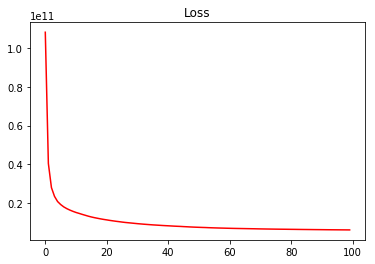

Weight for style1 is:  0.0


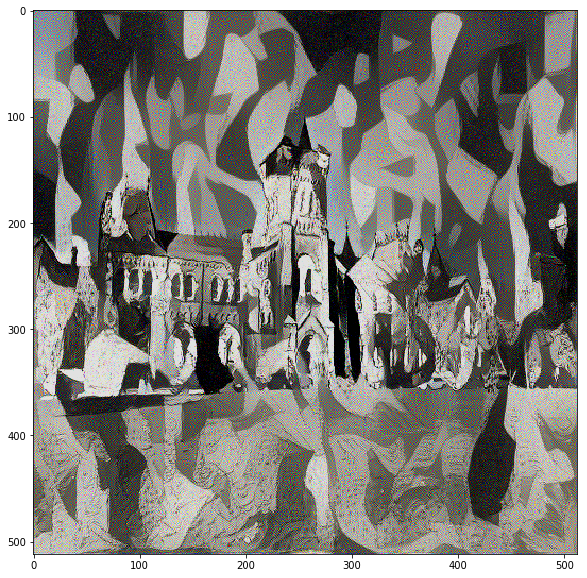

                 
                 
Current weight for style1 is :  0.1
Currtent epoch is 0; Current loss value: 1.75528e+11
epoch 0 completed in 27s
Currtent epoch is 10; Current loss value: 9.46295e+10
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 9.08549e+10
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 8.90183e+10
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 8.80025e+10
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 8.73478e+10
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 8.68894e+10
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 8.64956e+10
epoch 70 completed in 27s
Currtent epoch is 80; Current loss value: 8.62442e+10
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 8.60813e+10
epoch 90 completed in 26s


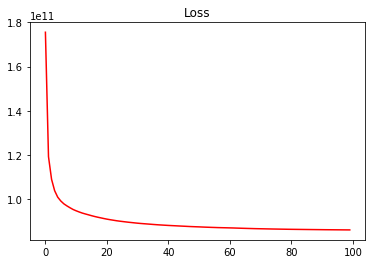

Weight for style1 is:  0.1


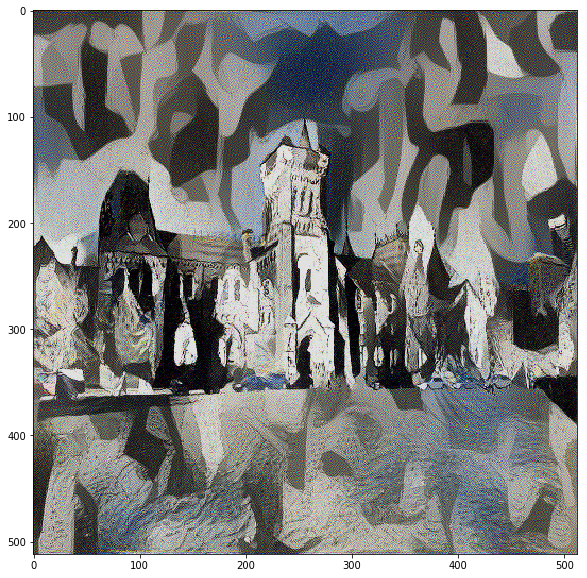

                 
                 
Current weight for style1 is :  0.2
Currtent epoch is 0; Current loss value: 2.34257e+11
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 1.56444e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 1.52823e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 1.51028e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 1.5006e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 1.49454e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 1.49072e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 1.48815e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 1.48633e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 1.48492e+11
epoch 90 completed in 26s


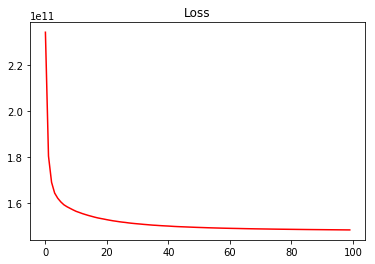

Weight for style1 is:  0.2


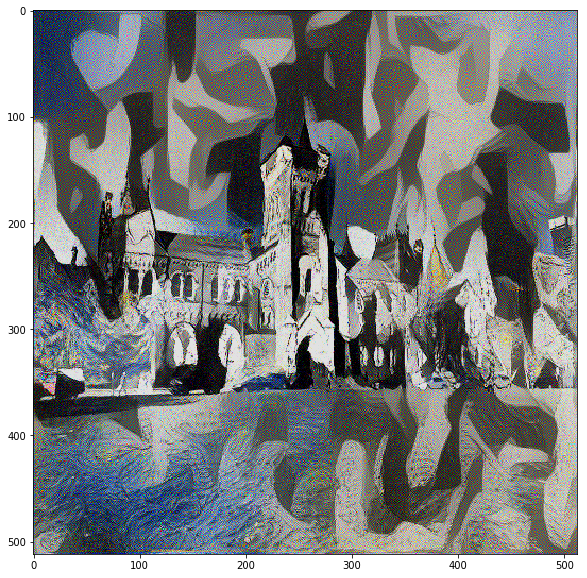

                 
                 
Current weight for style1 is :  0.3
Currtent epoch is 0; Current loss value: 2.70569e+11
epoch 0 completed in 27s
Currtent epoch is 10; Current loss value: 2.00703e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 1.97114e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 1.95445e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 1.94456e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 1.93883e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 1.93468e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 1.93207e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 1.93016e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 1.92876e+11
epoch 90 completed in 26s


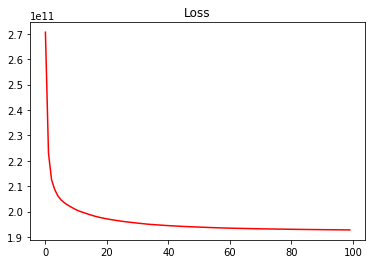

Weight for style1 is:  0.3


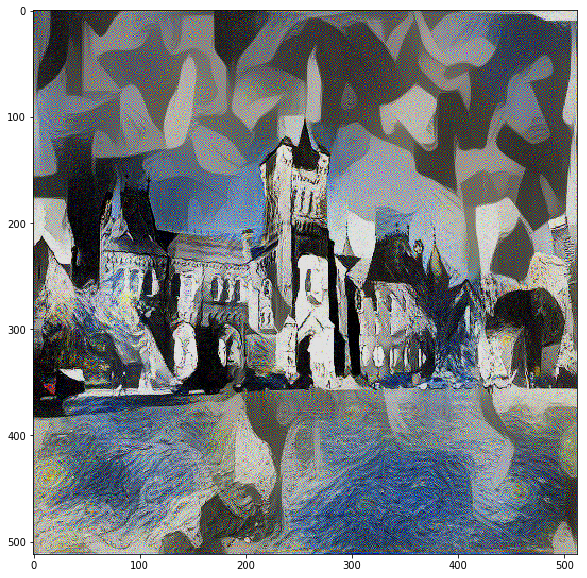

                 
                 
Current weight for style1 is :  0.4
Currtent epoch is 0; Current loss value: 2.93121e+11
epoch 0 completed in 27s
Currtent epoch is 10; Current loss value: 2.27276e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 2.23761e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 2.21956e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 2.21084e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 2.2053e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 2.20177e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 2.19922e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 2.19723e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 2.19577e+11
epoch 90 completed in 26s


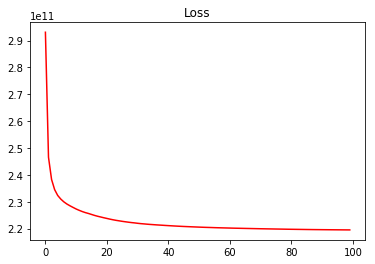

Weight for style1 is:  0.4


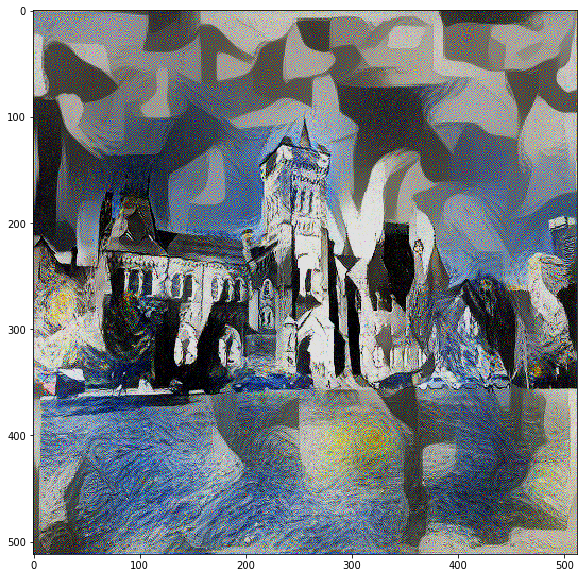

                 
                 
Current weight for style1 is :  0.5
Currtent epoch is 0; Current loss value: 3.04393e+11
epoch 0 completed in 27s
Currtent epoch is 10; Current loss value: 2.35341e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 2.3232e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 2.30581e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 2.29751e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 2.2928e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 2.28933e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 2.28677e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 2.28502e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 2.28378e+11
epoch 90 completed in 26s


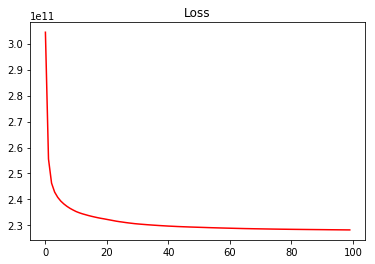

Weight for style1 is:  0.5


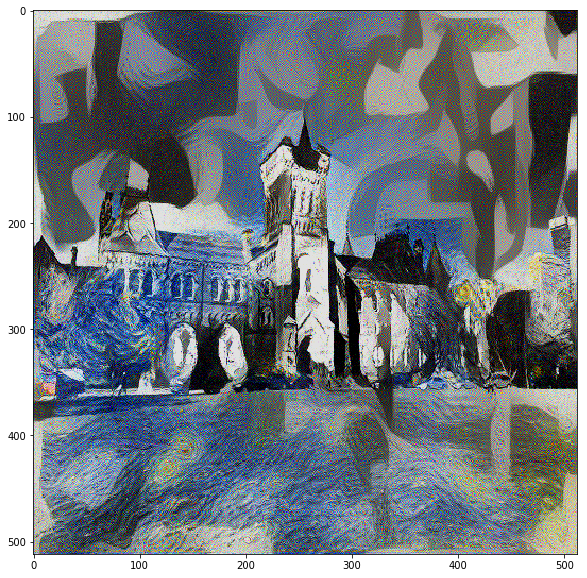

                 
                 
Current weight for style1 is :  0.6
Currtent epoch is 0; Current loss value: 2.9324e+11
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 2.26463e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 2.2325e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 2.21691e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 2.20894e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 2.20408e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 2.20018e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 2.19786e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 2.19626e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 2.19503e+11
epoch 90 completed in 26s


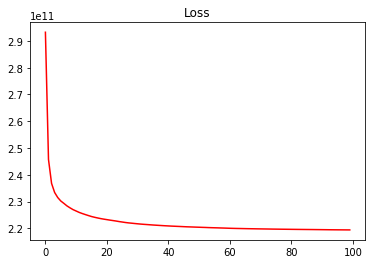

Weight for style1 is:  0.6


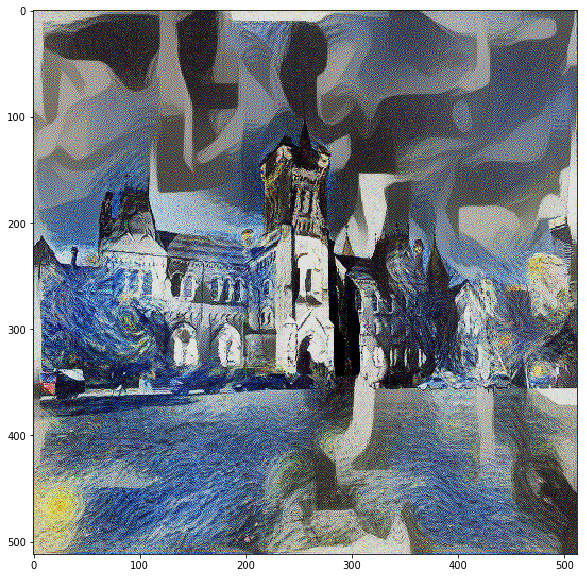

                 
                 
Current weight for style1 is :  0.7
Currtent epoch is 0; Current loss value: 2.54721e+11
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 1.99145e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 1.95948e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 1.94523e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 1.93809e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 1.93366e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 1.93074e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 1.92866e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 1.92723e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 1.92612e+11
epoch 90 completed in 26s


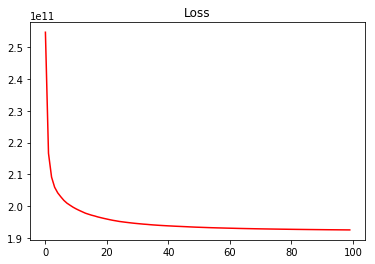

Weight for style1 is:  0.7


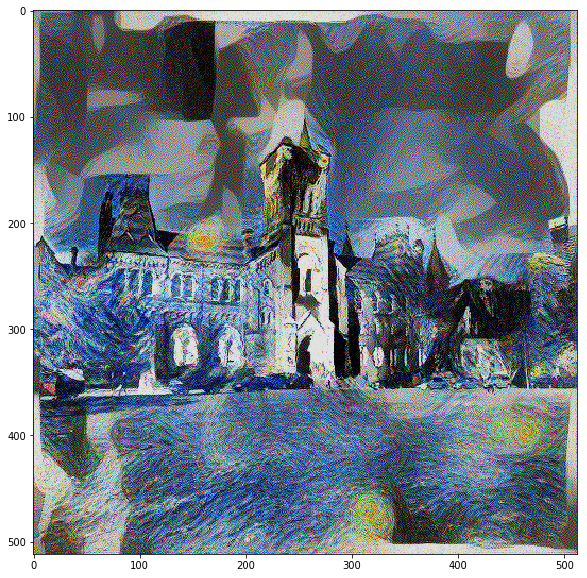

                 
                 
Current weight for style1 is :  0.8
Currtent epoch is 0; Current loss value: 2.0787e+11
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 1.54735e+11
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 1.51484e+11
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 1.49946e+11
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 1.49179e+11
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 1.4876e+11
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 1.48452e+11
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 1.48243e+11
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 1.48095e+11
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 1.47992e+11
epoch 90 completed in 26s


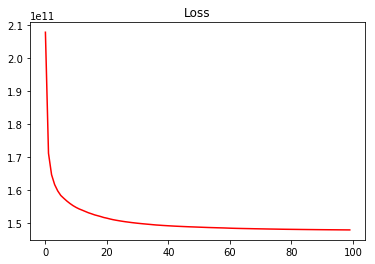

Weight for style1 is:  0.8


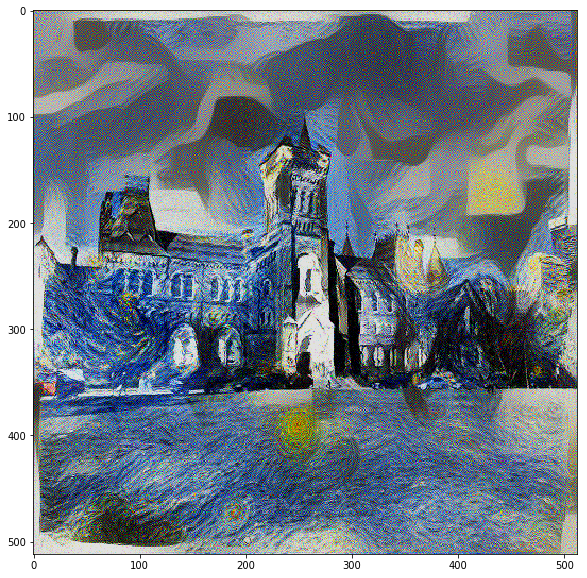

                 
                 
Current weight for style1 is :  0.9
Currtent epoch is 0; Current loss value: 1.43649e+11
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 9.23424e+10
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 8.91629e+10
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 8.77982e+10
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 8.70441e+10
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 8.6592e+10
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 8.63036e+10
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 8.60786e+10
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 8.59207e+10
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 8.58048e+10
epoch 90 completed in 26s


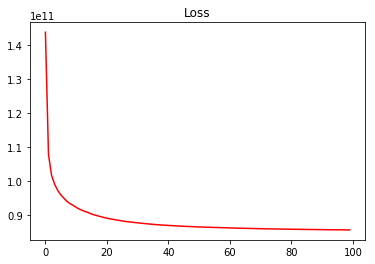

Weight for style1 is:  0.9


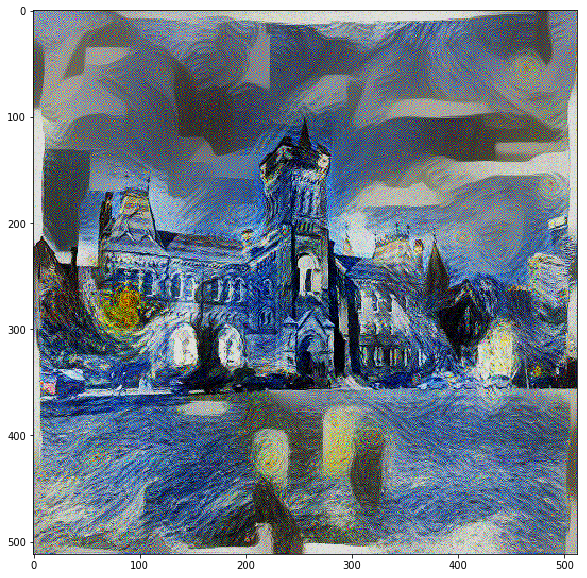

                 
                 
Current weight for style1 is :  1.0
Currtent epoch is 0; Current loss value: 6.60207e+10
epoch 0 completed in 26s
Currtent epoch is 10; Current loss value: 1.18482e+10
epoch 10 completed in 26s
Currtent epoch is 20; Current loss value: 8.73547e+09
epoch 20 completed in 26s
Currtent epoch is 30; Current loss value: 7.34996e+09
epoch 30 completed in 26s
Currtent epoch is 40; Current loss value: 6.6374e+09
epoch 40 completed in 26s
Currtent epoch is 50; Current loss value: 6.21548e+09
epoch 50 completed in 26s
Currtent epoch is 60; Current loss value: 5.94216e+09
epoch 60 completed in 26s
Currtent epoch is 70; Current loss value: 5.74182e+09
epoch 70 completed in 26s
Currtent epoch is 80; Current loss value: 5.57003e+09
epoch 80 completed in 26s
Currtent epoch is 90; Current loss value: 5.45163e+09
epoch 90 completed in 26s


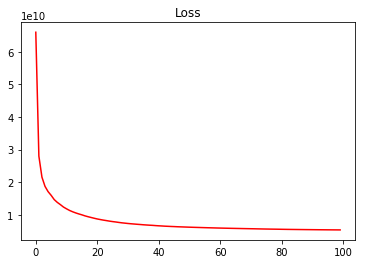

Weight for style1 is:  1.0


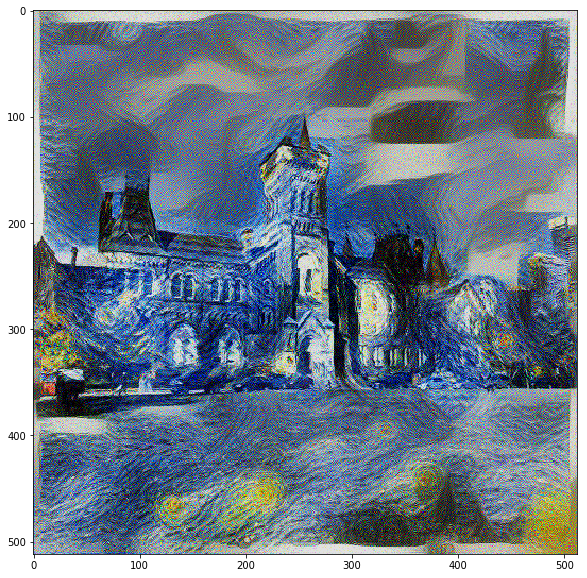

In [21]:
option = 'weighted_gram'
for w in np.arange(0.0, 1.1, 0.1):
    content_weight = 0.01
    style_weight = 400
    
    content_image= backend.variable(content_array)
    average_style_image = backend.variable(average_style_array)
    style1_image = backend.variable(style1_array)
    style2_image = backend.variable(style2_array)
    combination_image = backend.placeholder((1,height,width,3))

    input_tensor = backend.concatenate([content_image,average_style_image,style1_image,style2_image, combination_image], axis=0)

    model = VGG16(input_tensor=input_tensor, weights='imagenet', include_top=False)

    layers = dict([(layer.name, layer.output) for layer in model.layers])

    style_layer = ['block1_conv2', 'block2_conv2','block3_conv3', 'block4_conv3','block5_conv3']

    content_layer = ['block2_conv2']
    
    print('Current weight for style1 is : ', w)
    
    loss = total_loss(layers, content_layer, content_weight, style_layer, style_weight, option, w=w)
    grads = backend.gradients(loss, combination_image)
    outputs = [loss]
    outputs += grads
    
    f_outputs = backend.function([combination_image], outputs)
    evaluator = Evaluator()
    x = np.random.uniform(0, 255, (1, height, width, 3)) - 128
    
    epochs = 100
    
    loss_value = []
    
    for i in range(epochs):
        s_time = time.time()
        x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun = 20)
        loss_value.append(min_val)
        f_time = time.time()
        if i % 10 == 0:
            print('Currtent epoch is', i, end = "; ")
            print('Current loss value:', min_val)
            print('epoch %d completed in %ds' % (i, f_time - s_time))
    plt.figure()
    plt.title('Loss')
    plt.plot(range(epochs), loss_value, 'red')
    plt.show()
    print('Weight for style1 is: ', w)
    img = Image.fromarray(restore_image(x))
    plt.figure(figsize=(10, 10))
    plt.imshow(img) 
    plt.show()
    print('                 ')
    print('                 ')
    backend.clear_session()